# Análise de casos de obesidade - KNN

Citação: Golino, Hudson; Mauro Assis Gomes, Cristiano; Fernando Pimentel Duarte, Stênio (2014): Dados da pesquisa sobre obesidade em formato .xlsx. figshare. Dataset. https://doi.org/10.6084/m9.figshare.1142238.v1 

Idade - idade do paciente<br />	
GeneroCod - indicador de gênero<br />	
Eobeso - indicador de obesidade<br /> 	
fumo_atual - indicador de fumante atual<br />	
imc	- índice de massa corporal<br />
obesoHer - obesidade na família<br />
cc - circunferência da cintura<br />
cq - circunferência do quadril<br />	
rcq	- relação cintura / quadril<br /> 
frqCardiaca	- frequência cardíaca<br />
fumo - indicador de fumante<br />	
atvFisica - indicador de frequência de atividade física<br />	
stress - indicador de frequência de stress<br />
psisto - <br />	
pdiasto	- <br />	
psisalta - 





In [197]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix

%matplotlib inline

In [198]:
df = pd.read_df = pd.read_csv('obesidade.csv', ";")

In [199]:
df.head()

,ID,Idade,GeneroCod,Eobeso,fumo_atual,imc,obesoHer,cc,cq,rcq,frqCardiaca,fumo,atvFisica,stress,psisto,pdiasto,psisalta
0,1,20,2,Não,0,27.94,0,95,112,0.85,75,0,2,3,120.00,80.00,0
1,2,31,1,Não,0,28.76,0,88,101,0.87,66,0,2,0,128.00,74.33,1
2,3,19,2,Não,0,25.35,0,79,102,0.77,69,0,2,0,113.33,70.00,0
3,4,20,2,Não,0,20.73,0,91,80,1.14,85,0,0,0,130.00,76.67,1
4,5,19,2,Não,0,24.54,0,83,98,0.85,72,0,2,0,130.00,80.00,1


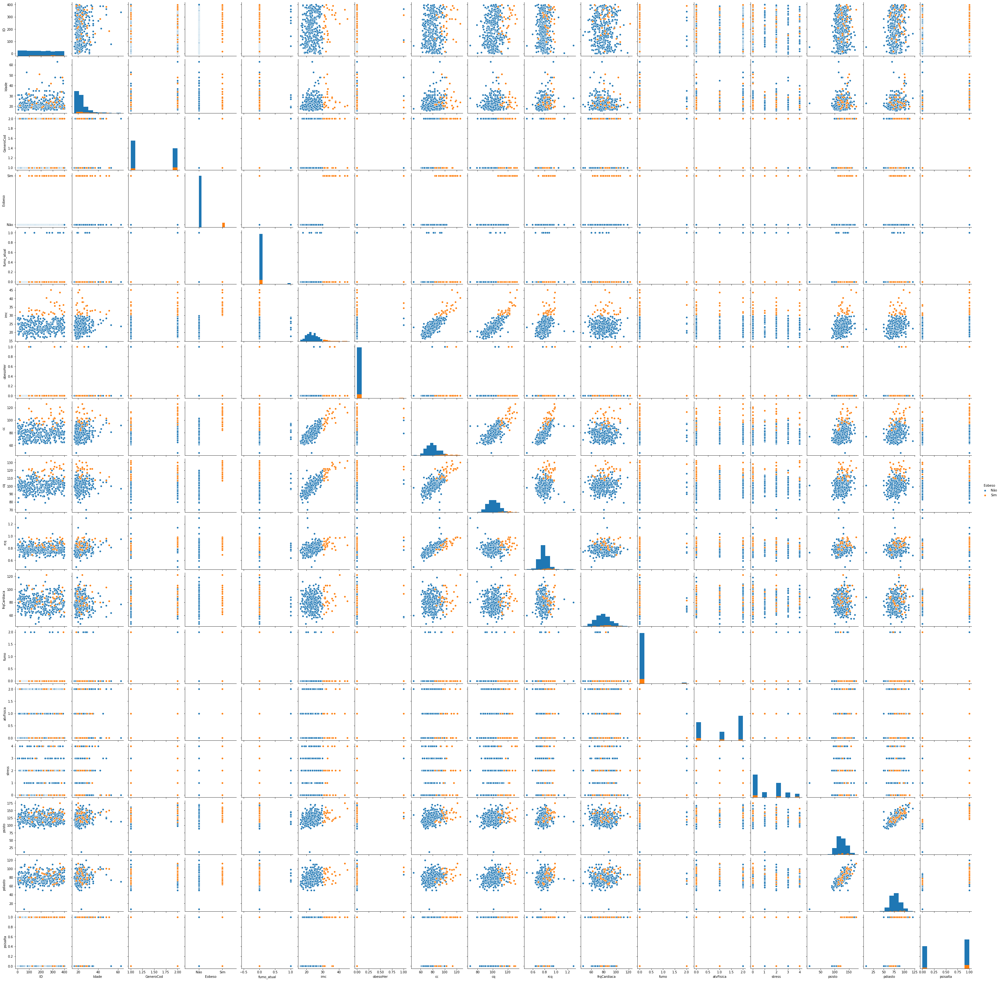

In [200]:
# Imc apresenta melhor dispersão em relação aos demais atributos

ax = sns.pairplot(df, hue="Eobeso", diag_kind="hist", vars=df.columns)
#ax.savefig('plot_obesidade.png', dpi=400)

In [201]:
scaler = StandardScaler()

X = df.drop(['ID','Eobeso'], axis=1) 
y = df['Eobeso']

scaled_features = scaler.fit_transform(X)
X = pd.DataFrame(scaled_features,columns=X.columns)

X.head()

,Idade,GeneroCod,fumo_atual,imc,obesoHer,cc,cq,rcq,frqCardiaca,fumo,atvFisica,stress,psisto,pdiasto,psisalta
0,-0.521343,1.133893,-0.142857,0.924702,-0.100504,1.243567,1.159880,0.719146,-0.409428,-0.13346,1.006832,1.324341,-0.278504,0.071972,-1.187282
1,1.305018,-0.881917,-0.142857,1.116912,-0.100504,0.624657,-0.076726,0.980892,-1.173919,-0.13346,1.006832,-0.955730,0.200715,-0.389008,0.842260
2,-0.687376,1.133893,-0.142857,0.317598,-0.100504,-0.171084,0.035693,-0.327836,-0.919088,-0.13346,1.006832,-0.955730,-0.678054,-0.741044,-1.187282
3,-0.521343,1.133893,-0.142857,-0.765343,-0.100504,0.889904,-2.437518,4.514458,0.440007,-0.13346,-1.205985,-0.955730,0.320520,-0.198762,0.842260
4,-0.687376,1.133893,-0.142857,0.127732,-0.100504,0.182578,-0.413982,0.719146,-0.664258,-0.13346,1.006832,-0.955730,0.320520,0.071972,0.842260


In [202]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_features,df['Eobeso'], test_size=0.3, random_state=1)


In [203]:
knn = KNeighborsClassifier()

In [204]:
from sklearn.model_selection import GridSearchCV

k_list = list(range(1,40))

parametros = dict(n_neighbors=k_list)

grid = GridSearchCV(knn, parametros, cv=5, scoring='accuracy')
grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...]},
             scoring='accuracy')

Melhor parâmetro {'n_neighbors': 7} com o valor de acurácia 0.9607142857142857 



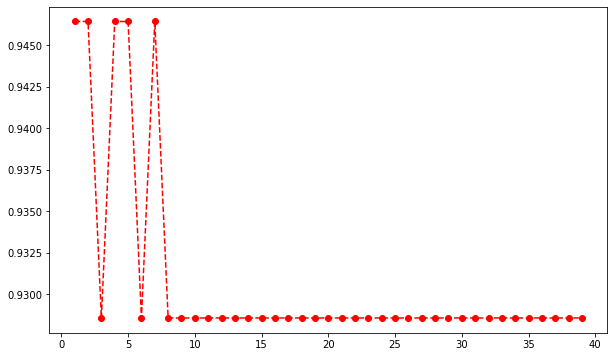

In [207]:
plt.figure(figsize=(10,6))
plt.plot(k_list,grid.cv_results_['split0_test_score'],color='red',linestyle='dashed',marker='o')
print("Melhor parâmetro {} com o valor de acurácia {} ".format(grid.best_params_,grid.best_score_))
print("")

In [208]:
# Relatório K = 7

knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)

predict = knn.predict(X_test)
print(classification_report(y_test,predict))

print(confusion_matrix(y_test,predict))

              precision    recall  f1-score   support

         Não       0.92      1.00      0.96       109
         Sim       1.00      0.18      0.31        11

    accuracy                           0.93       120
   macro avg       0.96      0.59      0.63       120
weighted avg       0.93      0.93      0.90       120

[[109   0]
 [  9   2]]
